<a href="https://colab.research.google.com/github/tnguyennr/Intro-to-Deep-Learning/blob/main/Week3_Histopathology_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Problem Statement and Intro

In this competition, you must create an algorithm to identify metastatic cancer in small image patches taken from larger digital pathology scans.

[PCam] packs the clinically-relevant task of metastasis detection into a straight-forward binary image classification task, akin to CIFAR-10 and MNIST. Models can easily be trained on a single GPU in a couple hours, and achieve competitive scores in the Camelyon16 tasks of tumor detection and whole-slide image diagnosis. Furthermore, the balance between task-difficulty and tractability makes it a prime suspect for fundamental machine learning research on topics as active learning, model uncertainty, and explainability. [link text](https://)

##Imports and Loading Data

In [ ]:
#Read in Data
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

import tensorflow as tf
import keras
from keras.models import Sequential
from tensorflow.keras import layers, models
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import Sequence

import matplotlib.pyplot as plt
from PIL import Image

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:

from google.colab import files
files.upload()  # This will allow you to upload the kaggle.json file which is your API key



In [ ]:
# Create the Kaggle directory
!mkdir -p ~/.kaggle

# Move the kaggle.json file to the appropriate location
!mv kaggle.json ~/.kaggle/

# Set permissions to read the file securely
!chmod 600 ~/.kaggle/kaggle.json


In [ ]:
!pip install kaggle


In [ ]:
#Download data from kaggle website
!kaggle competitions download -c histopathologic-cancer-detection

100% 6.29G/6.31G [01:22<00:00, 97.0MB/s]
100% 6.31G/6.31G [01:22<00:00, 81.8MB/s]


In [ ]:
#Unzipping data to access
!unzip histopathologic-cancer-detection.zip


Streaming output truncated to the last 5000 lines.
  inflating: train/fa2c657eff58b6802cb32843caa2fac25b67c2c9.tif  
  inflating: train/fa2c775c4457d0aeb7e57216849eef5f4e72e566.tif  
  inflating: train/fa2c77e1707c2fe7b0016e00736fb6e4b7f09488.tif  
  inflating: train/fa2ce5e802dd281bd98fcfb538e80b9c96c2b7af.tif  
  inflating: train/fa2d24e4a109d2d3a925890aaed4e0f038dfffb0.tif  
  inflating: train/fa2d7e4865aa7869d2dd85116323b8405c94f1c2.tif  
  inflating: train/fa2d8b2e4acf46e278e2e7acbc034c263d970737.tif  
  inflating: train/fa2df9148831509a181797db79eb1a7bf39593f1.tif  
  inflating: train/fa2e6db0b35484797f58005e3a6e24ca75fbca76.tif  
  inflating: train/fa2e80e84594465329bdc0c8d1b3a507275fbb4d.tif  
  inflating: train/fa2eaf8ec6267fa928a88775dc15ee25b633c537.tif  
  inflating: train/fa2ebf31ff5954570526d4835ac5368fabc1f035.tif  
  inflating: train/fa2efd2dda5235a3e397ea0dd637ea13a78f7599.tif  
  inflating: train/fa2f1d5e86165f63c57acdf9d23521f2b8070e0c.tif  
  inflating: train/fa2ffa

In [ ]:


# List all files in the current directory

# List the files in the "train" directory (assuming it's in /content)
print(os.listdir('/content/train'))



['18768dab4bd3ed1272f19ded2e79f4502301ca4c.tif', '8289133ea29aa371ffb5c71cb510694cc9305ce2.tif', 'e04aea8404b7183fb310d72da447706e053085ae.tif', 'e272d4321aae0970137a7ff5f62624e7b283e70f.tif', '056a35c220f4faea29602617a770789bb7efa9be.tif', '156f756ccbeb9b5c4399b9fd2858c15f60c9f005.tif', '6a046a5e6c4ac1f1357cda783d4960cf4f592421.tif', '9d29d4f131a3bf26ecb88b06c367036050fd56f2.tif', 'c59e6f8831fffcd928096dbf1313b8a6c4959782.tif', '09a38a72e25182b87a06f0941df3c6316d0a1d0f.tif', '4fbef3027e0b9c56f27582e4a3a30216f5241ac7.tif', 'c726dba8ce3948854fd5c5bafd4e2d333de656a5.tif', '3aabdee49a632ebd5d2ce2bd012eceacd325eeb8.tif', '2e2caa76a342b868ad9a3a8d5b11c08fd8a85318.tif', '231dbed24e5f0367a69cbe8595281ac8edc57b9e.tif', '991a13d69a6bfdd2d1a1be70f9fa13ec2c66b3df.tif', '49aecb13a19bc0df87286e6e12014fba4e322e3b.tif', '9df51a3726426480fce89afa06878182efe0b143.tif', '9f3c30d1cf0772b13be2b23067e962febf994b20.tif', 'cb926a5e3a3574d7d5103a0fef87f386f5e2b095.tif', '4061cf3703f2dbf789e710057e1bff674da0b5

In [ ]:
#Read in labels for training data
train_labels = pd.read_csv('train_labels.csv')

## Data Preprocessing

In [ ]:
# Map the filenames to their labels
image_paths = train_labels['id'].apply(lambda x: '/content/train/' + x + '.tif').tolist()  # Adjust path if needed
labels = train_labels['label'].tolist()


In [ ]:

class ImageLabelGenerator(Sequence):
    def __init__(self, image_paths, labels, batch_size, target_size, shuffle=True):
        self.image_paths = image_paths
        self.labels = labels
        self.batch_size = batch_size
        self.target_size = target_size
        self.shuffle = shuffle
        self.indexes = np.arange(len(self.image_paths))
        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.image_paths) / self.batch_size))

    def __getitem__(self, index):
        batch_indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        batch_image_paths = [self.image_paths[k] for k in batch_indexes]
        batch_labels = [self.labels[k] for k in batch_indexes]

        # Load and preprocess the images
        images = [self.load_image(img_path) for img_path in batch_image_paths]
        return np.array(images), np.array(batch_labels)

    def load_image(self, img_path):
        # Load and resize the image
        image = load_img(img_path, target_size=self.target_size)
        image = img_to_array(image) / 255.0  # Rescale the image to [0, 1]
        return image

    def on_epoch_end(self):
        # Shuffle data at the end of each epoch if `shuffle=True`
        if self.shuffle:
            np.random.shuffle(self.indexes)


In [ ]:
from sklearn.model_selection import train_test_split

# Assuming image_paths is a list of image file paths and labels is a corresponding list of labels
image_paths = [...]  # List of paths to the images
labels = [...]  # List of labels corresponding to each image

# Split into training and validation sets (80% training, 20% validation)
train_paths, val_paths, train_labels, val_labels = train_test_split(
    image_paths, labels, test_size=0.2, random_state=42)


In [ ]:
batch_size = 32
target_size = (96, 96)


train_gen = ImageLabelGenerator(train_paths, train_labels, batch_size = batch_size, target_size = target_size)
val_gen = ImageLabelGenerator(val_paths, val_labels, batch_size = batch_size, target_size = target_size)


## Exploratory Data Anaylsis

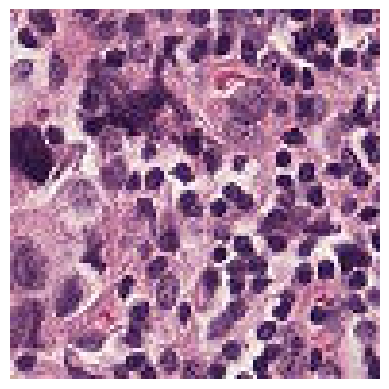

In [ ]:


#Viewing image

# Open the TIFF image using PIL
image_path = '/content/train/aa24c2361df6925309d3c69e9e35fbe0ae901ddf.tif'
image = Image.open(image_path)
width, height = image.size

# Show the image using matplotlib
plt.imshow(image)
plt.axis('off')  # Turn off the axis
plt.show()

print(f"Width: {width} pixels")
print(f"Height: {height} pixels")


In [ ]:
#Get idea of distribution of files

train_labels['label'].value_counts()

In [ ]:
sns.histplot(data = train_labels, x = 'label')


## Building Model and Choosing Architecture

In [ ]:
#Will be using some form of CNN here

#Hyperparameters - filter size, padding, number of filters, and stride
#Factors to consider for these might be something like image size.  Filter size may also impact padding
#What's the intuition behind this?

### Model 1

In [ ]:
gpus = tf.config.experimental.list_physical_devices('GPU')
# Set memory growth for GPU to avoid memory allocation errors
tf.config.experimental.set_memory_growth(gpus[0], True)


In [ ]:

#Model 1
model = models.Sequential()

# First Convolutional Layer
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(96, 96, 3)))
model.add(layers.MaxPooling2D((2, 2)))

# Second Convolutional Layer
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

# Third Convolutional Layer
model.add(layers.Conv2D(64, (3, 3), activation='relu'))

# Flatten the feature maps before passing to the dense layer
model.add(layers.Flatten())  # This will reshape the output to 25600 units

# Fully Connected Layer
model.add(layers.Dense(64, activation='relu'))

# Output Layer (2 units for binary classification)
model.add(layers.Dense(1, activation='sigmoid'))  # Use 'sigmoid' for binary classification

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Print the model summary to check input/output shapes
model.summary()




Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)                   │ (None, 94, 94, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 47, 47, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 45, 45, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 22, 22, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_14 (Conv2D)                   │ (None, 20, 20, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 25600)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 64)                  │       1,638,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,694,849 (6.47 MB)

 Trainable params: 1,694,849 (6.47 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
#New way to fit model w/ val set
model.fit(
    train_gen,  # Training generator
    validation_data=val_gen,  # Validation generator
    epochs=10,
    verbose=1
)


In [ ]:
# Train the model
model.fit(train_gen, epochs=10)

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6875/6875 ━━━━━━━━━━━━━━━━━━━━ 391s 56ms/step - accuracy: 0.7860 - loss: 0.4563
Epoch 2/10
6875/6875 ━━━━━━━━━━━━━━━━━━━━ 317s 46ms/step - accuracy: 0.8684 - loss: 0.3124
Epoch 3/10
6875/6875 ━━━━━━━━━━━━━━━━━━━━ 282s 41ms/step - accuracy: 0.8950 - loss: 0.2574
Epoch 4/10
6875/6875 ━━━━━━━━━━━━━━━━━━━━ 332s 43ms/step - accuracy: 0.9105 - loss: 0.2214
Epoch 5/10
6875/6875 ━━━━━━━━━━━━━━━━━━━━ 298s 43ms/step - accuracy: 0.9237 - loss: 0.1910
Epoch 6/10
6875/6875 ━━━━━━━━━━━━━━━━━━━━ 324s 44ms/step - accuracy: 0.9386 - loss: 0.1580
Epoch 7/10
6875/6875 ━━━━━━━━━━━━━━━━━━━━ 294s 43ms/step - accuracy: 0.9499 - loss: 0.1301
Epoch 8/10
6875/6875 ━━━━━━━━━━━━━━━━━━━━ 293s 43ms/step - accuracy: 0.9605 - loss: 0.1062
Epoch 9/10
6875/6875 ━━━━━━━━━━━━━━━━━━━━ 326s 43ms/step - accuracy: 0.9680 - loss: 0.0869
Epoch 10/10
6875/6875 ━━━━━━━━━━━━━━━━━━━━ 297s 43ms/step - accuracy: 0.9753 - loss: 0.0684


### Model 2

In [ ]:
model2 = models.Sequential()

# First Convolutional Layer with increased filters
model2.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=(96, 96, 3)))
model2.add(layers.MaxPooling2D((2, 2)))

# Second Convolutional Layer with increased filters
model2.add(layers.Conv2D(128, (3, 3), activation='relu'))
model2.add(layers.MaxPooling2D((2, 2)))

# Third Convolutional Layer with LeakyReLU instead of ReLU
model2.add(layers.Conv2D(128, (3, 3)))
model2.add(layers.LeakyReLU(alpha=0.2))  # LeakyReLU with small slope to avoid dying neurons

# Add Dropout after the convolutional layers to reduce overfitting
model2.add(layers.Dropout(0.3))  # Drop 30% of neurons in the convolutional part

# Flatten the feature maps before passing to the dense layer
model2.add(layers.Flatten())  # This will reshape the output to 200704 units (after pooling)

# Fully Connected Layer with more neurons (increased complexity)
model2.add(layers.Dense(128, activation='relu'))

# Output Layer with sigmoid activation (same as the original model)
model2.add(layers.Dense(1, activation='sigmoid'))  # Use 'sigmoid' for binary classification

# Compile the model with a different optimizer
model2.compile(optimizer='SGD', loss='binary_crossentropy', metrics=['accuracy'])

# Print the model summary to check input/output shapes
model2.summary()

In [ ]:
#fit model w/ val set
model2.fit(
    train_gen,  # Training generator
    validation_data=val_gen,  # Validation generator
    epochs=10,
    verbose=1
)


In [ ]:
model2.fit(train_gen, epochs=10)

## Results and Analysis and Model Selection

In [ ]:
# compare models with different architectures - different hyperparameter values
# choose metric to compare performance - accuracy, recall, precision, etc.

In [ ]:
#Make predictions on final model selected?


# Set the path to the test folder where your images are stored
test_folder = '/content/test'

# Define the ImageDataGenerator for test data (no rescaling needed unless specified)
test_datagen = ImageDataGenerator(rescale=1./255)

# Use flow_from_directory or flow_from_dataframe to load images
# flow_from_directory assumes images are organized in subdirectories by class.
test_gen = test_datagen.flow_from_directory(
    test_folder,
    target_size=(96, 96),  # The target size of the image, adjust as needed
    batch_size=32,
    class_mode=None,  # We only need the images, not the labels
    shuffle=False      # Set shuffle=False so that images are returned in order
)

# Predict using the model
predictions = model.predict(test_gen, verbose=1)

# Convert probabilities to class labels (0 or 1)
predicted_classes = (predictions > 0.5).astype('int32')  # Adjust threshold if necessary

# Get the image IDs (filenames)
image_ids = test_gen.filenames

# Create a DataFrame with image IDs and corresponding predictions
results = pd.DataFrame({
    'image_id': image_ids,
    'label': predicted_classes.flatten()  # Flatten the array to make it a 1D column
})

# Optionally, save to a CSV file
results.to_csv('/content/predictions.csv', index=False)

# Show the results
print(results.head())


Found 0 images belonging to 0 classes.


ValueError: Must provide at least one structure

In [ ]:
test_image_paths = [filename for filename in os.listdir('/content/test') if filename.endswith('.tif')]


In [ ]:
df_test = pd.DataFrame({
    'id': test_image_paths,
    'class': [0] * len(test_image_paths)  # You can put any dummy values here since they won't be used
})

In [ ]:
df_test

,id,class
0,1ecb59468b5e13c0b6f6f36f52442cc6b644c8cf.tif,0
1,99a607d2b605048037940bf665c6d5c143f5bc55.tif,0
2,84eab5b8b797281e642ca78b8583a6ae146413a4.tif,0
3,bfa8ed857483c271dc379603e2d1da0c3eb0ebd5.tif,0
4,06f7f38293a1e7fc66a0dffebcf29b7dd8cac238.tif,0
...,...,...
57453,fc2e1e53dee803f2aa0271b0c9b90188f98bf648.tif,0
57454,5457a52ea1a070cc3327be5c460f7ed23a7d2c4d.tif,0
57455,79b1792193c344a7e325179b28fe885a9f80d843.tif,0
57456,384a18ff1274505563a4a727ff706a4db2a1d1f0.tif,0


In [ ]:
import os

# Let's assume the test images are in '/content/test' and are not in subdirectories
test_image_paths = [filename for filename in os.listdir('/content/test') if filename.endswith('.tif')]

# Create a DataFrame with image paths and dummy labels (not used during prediction)
df_test = pd.DataFrame({
    'id': test_image_paths,
    'class': None  # You can put any dummy values here since they won't be used
})

# Use flow_from_dataframe to load images
test_datagen = ImageDataGenerator(rescale=1./255)

test_gen = test_datagen.flow_from_dataframe(
    df_test,
    directory=None,  # Because the full paths are already in the dataframe
    x_col='id',  # Column with the image file paths
    y_col='class',  # No target column for predictions
    target_size=(96, 96),  # Resize the images as per your model's input size
    batch_size=32,  # You can adjust based on your GPU capacity
    shuffle=False  # No need to shuffle for predictions
)


# Predict using the model
predictions = model.predict(test_gen, verbose=1)

# Convert probabilities to class labels (0 or 1)
predicted_labels = (predictions > 0.5).astype('int32')  # Assuming a binary classification model

# Create a DataFrame to store image IDs and predictions
predictions_df = pd.DataFrame({
    'id': df_test['filename'].apply(lambda x: x.split('/')[-1]),  # Extract image filenames
    'label': predicted_labels.flatten()  # Flatten the predictions to match the image list
})

print(predictions_df.head())  # Display the first few predictions


TypeError: If class_mode="categorical", y_col="class" column values must be type string, list or tuple.

In [ ]:
import os
import pandas as pd
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Let's assume the test images are in '/content/test' and are not in subdirectories
test_image_paths = [os.path.join('/content/test', filename) for filename in os.listdir('/content/test') if filename.endswith('.tif')]

# Create a DataFrame with image paths and dummy labels (not used during prediction)
df_test = pd.DataFrame({
    'id': test_image_paths,  # Use the full paths of the images
    'class': ''  # Empty string or any dummy value for the 'class' column (this won't be used)
})

# Use flow_from_dataframe to load images
test_datagen = ImageDataGenerator(rescale=1./255)

test_gen = test_datagen.flow_from_dataframe(
    df_test,
    directory=None,  # We are using full paths, so no need to specify directory
    x_col='id',  # Column with the image file paths
    y_col='class',  # Dummy column for labels, will not be used for prediction
    target_size=(96, 96),  # Resize the images to match your model's input size
    batch_size=32,  # Adjust based on GPU/CPU capacity
    shuffle=False  # No need to shuffle the images for predictions
)

# Predict using the model
predictions = model.predict(test_gen, verbose=1)

# Convert probabilities to class labels (0 or 1)
predicted_labels = (predictions > 0.5).astype('int32')  # Assuming binary classification

# Create a DataFrame to store image IDs and predictions
predictions_df = pd.DataFrame({
    'id': df_test['id'].apply(lambda x: os.path.basename(x)),  # Extract the image filenames (just the filename, not the full path)
    'label': predicted_labels.flatten()  # Flatten the predictions to match the image list
})

print(predictions_df.head())  # Display the first few predictions


Found 57458 validated image filenames belonging to 1 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1796/1796 ━━━━━━━━━━━━━━━━━━━━ 99s 54ms/step
                                             id  label
0  1ecb59468b5e13c0b6f6f36f52442cc6b644c8cf.tif      0
1  99a607d2b605048037940bf665c6d5c143f5bc55.tif      0
2  84eab5b8b797281e642ca78b8583a6ae146413a4.tif      0
3  bfa8ed857483c271dc379603e2d1da0c3eb0ebd5.tif      1
4  06f7f38293a1e7fc66a0dffebcf29b7dd8cac238.tif      0


In [ ]:
predictions_df.head()

,id,label
0,e176332a2dbb6a702a8e3bccba8346f6de7d2b8a.tif,0
1,e0edbc953d511083f3c81e433b68e4d795eceb1b.tif,0
2,056916135d0d77554b817240d1d2613993342e12.tif,0
3,34fdbb0cf908f41eca34c1727faefda6e01b5af9.tif,0
4,bb88f691a2259613bc861618d9ee28f216563344.tif,1


In [ ]:
# Remove the '.tif' extension from the 'id' column
predictions_df['id'] = predictions_df['id'].apply(lambda x: os.path.splitext(os.path.basename(x))[0])

# Now the 'id' column will only have the filenames without the '.tif' extension


In [ ]:
predictions_df[predictions_df['id']== '99a607d2b605048037940bf665c6d5c143f5bc55']

,id,label
1,99a607d2b605048037940bf665c6d5c143f5bc55,0


In [ ]:
predictions_df.to_csv('hist_pred.csv')

In [ ]:
!cp hist_pred.csv "drive/My Drive/"

## Conclusion

What worked well:
- Training in batches
- Filter size selection
- Number of convolutions
- Using GPU for more efficient training

What need to do in the future:
- Split training into validation set
- More hyperparameter tuning
-

Key differences for model 2

Key Differences:

    Convolutional Layers:
        Increased Filters: The number of filters in the first and second convolutional layers was increased from 32 and 64 to 64 and 128, respectively. This may allow the model to learn more complex features at earlier stages.
        LeakyReLU in the Third Layer: Instead of ReLU, the third convolutional layer uses LeakyReLU with a small slope (alpha=0.2). LeakyReLU can help prevent the issue of "dying ReLUs," which may be useful in some cases.

    Dropout:
        Added a Dropout layer (with a 30% dropout rate) after the third convolutional layer to help prevent overfitting, which is useful when training on a small dataset.

    Fully Connected Layer:
        Increased the number of units in the dense layer from 64 to 128 to potentially learn more complex patterns.

    Optimizer:
        Switched the optimizer from Adam to SGD (Stochastic Gradient Descent). While Adam is adaptive, SGD may result in a more stable or robust model for certain tasks, especially when fine-tuning learning rates or using momentum.

To do as of 11/17
- Re-train models with validation sets
- Select better performing model in terms of some metric (accuracy, recall, precision, etc.)
- Basic visualizations in eda section - just add histplot of response to see if it is balanced or not
- Write out differences between the models
- Write conclusion
- Upload and submit

